#  DADA(Distance and Degree Attachment model) For synthetic Power Grid
Reference:  A Study of Cascading Failures in Real and
 Synthetic Power Grid Topologies

## Installing and Importing Necessary Libraries

In [1]:
#!pip install numpy
#!pip install networkx
#!pip install matplotlib
#!pip install pandas
#!pip install scipy
#!pip install power-grid-model

In [2]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt


In [3]:
def generate_dada_network(n, l, mu=6, rho=1):
    """
    Generates a Degree And Distance Attachment (DADA) model network.

    Parameters:
    n (int): Number of nodes.
    l (int): Target number of edges in the network.
    mu (float): Distance penalty factor; higher values discourage long-distance connections.
    rho (float): Resistivity factor for edges.

    Returns:
    G (nx.Graph): Generated network with n nodes and approximately l edges.
    """

    # Initialize an empty graph
    G = nx.Graph()

    # Generate node positions on a 2D plane with uniform random distribution
    positions = {i: (np.random.rand(), np.random.rand()) for i in range(n)}

    # Add nodes to the graph
    G.add_nodes_from(range(n))

    # Pre-compute average degree and integer connections per node
    avg_degree = l / n
    num_connections = {i: int(avg_degree) for i in range(n)}
    extra_connections = l - sum(num_connections.values())

    # Distribute additional connections randomly
    for i in np.random.choice(range(n), extra_connections, replace=False):
        num_connections[i] += 1

    # Helper function to calculate distance between two nodes
    def distance(i, j):
        return np.sqrt((positions[i][0] - positions[j][0]) ** 2 + (positions[i][1] - positions[j][1]) ** 2)

    # Iterate over nodes to connect them based on DADA model
    for j in range(1, n):
        possible_edges = []
        for i in range(j):  # Consider only nodes that are already in the network
            dist = distance(i, j)
            prob = G.degree[i] / (dist ** mu) if dist != 0 else 0
            possible_edges.append((i, j, prob, dist))

        # Sort by probability (high to low) and select top connections based on num_connections[j]
        possible_edges = sorted(possible_edges, key=lambda x: x[2], reverse=True)
        for edge in possible_edges[:num_connections[j]]:
            i, j, _, dist = edge
            G.add_edge(i, j, resistance=rho * dist)

    return G, positions



In [4]:
def plot_network(G, positions, title="DADA Model Network"):
    """
    Plots the generated network with positions.

    Parameters:
    G (nx.Graph): The graph to be plotted.
    positions (dict): Node positions in a 2D plane.
    title (str): Title for the plot.
    """
    plt.figure(figsize=(8, 8))
    nx.draw(G, pos=positions, node_size=50, with_labels=False, edge_color="skyblue", node_color="orange")
    plt.title(title)
    plt.show()



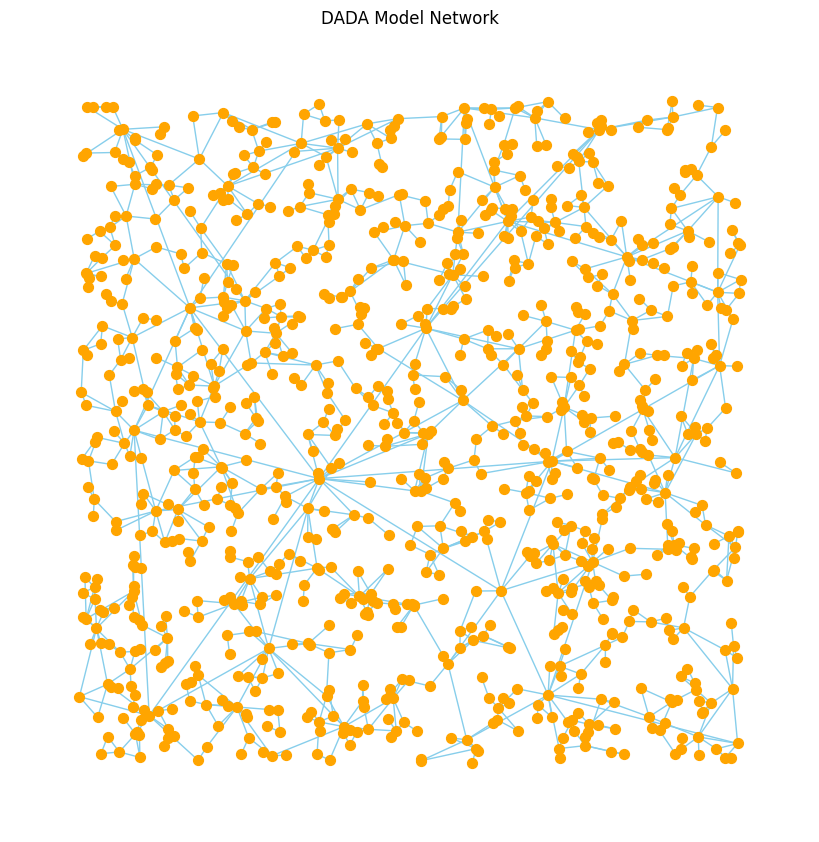

In [5]:
# Parameters
n = 1000  # Number of nodes
l = 1500  # Target number of edges
mu = 5  # Distance penalty
rho = 1  # Resistivity

# Generate the network
G, positions = generate_dada_network(n, l, mu, rho)

# Plot the generated network
plot_network(G, positions)


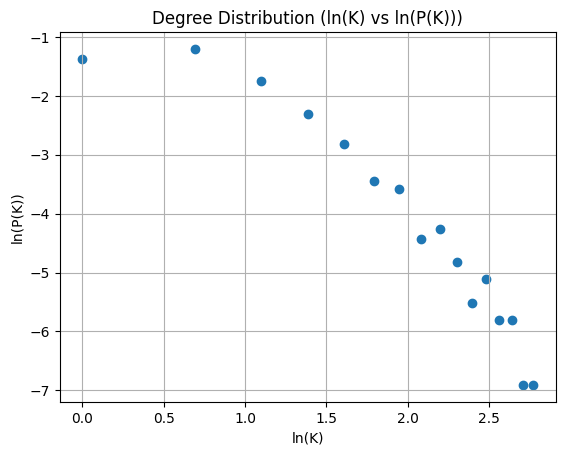

In [6]:
def analyze_degree_distribution(G):
  """
  Analyzes the degree distribution of the network and plots ln(K) vs ln(P(K))

  Args:
      G (nx.Graph): The generated network.
  """
  degree_sequence = [G.degree[i] for i in G.nodes]
  degree_counts = np.bincount(degree_sequence)
  degree_probs = degree_counts / len(degree_sequence)  # Probability of each degree

  # Filter out zero probabilities before log
  non_zero_probs = degree_probs[degree_probs > 0]
  filtered_degrees = np.arange(len(non_zero_probs)) + 1  # Corresponding degrees

  # Calculate ln(K) and ln(P(K))
  ln_degrees = np.log(filtered_degrees)  # K (degrees) with log applied
  ln_probs = np.log(non_zero_probs)  # P(K) with log applied

  # Plot ln(K) vs ln(P(K))
  plt.figure()
  plt.scatter(ln_degrees, ln_probs)
  plt.xlabel("ln(K)")
  plt.ylabel("ln(P(K))")
  plt.title("Degree Distribution (ln(K) vs ln(P(K)))")
  plt.grid(True)
  plt.show()

# Analyze and plot the degree distribution
analyze_degree_distribution(G)

<ipython-input-7-18c14988d12f>:22: RuntimeWarning: divide by zero encountered in log
  ln_hist = np.log(hist)


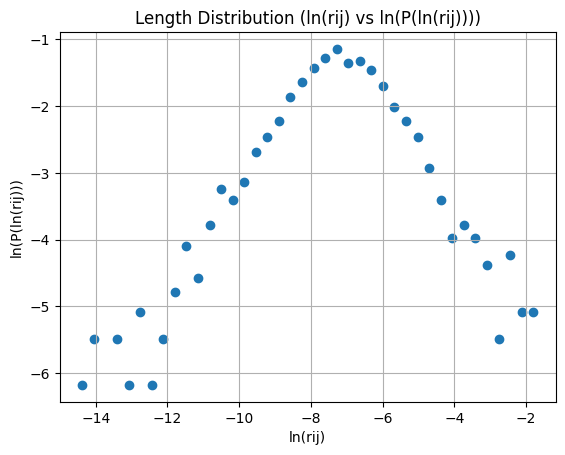

In [7]:
def analyze_length_distribution(G, positions):
  """
  Analyzes the length distribution of the network and plots ln(rij) vs ln(P(ln(rij)))

  Args:
      G (nx.Graph): The generated network.
      positions (dict): Node positions.
  """

  edge_lengths = []
  for edge in G.edges():
    i, j = edge
    edge_lengths.append((np.linalg.norm(np.array(positions[i]) - np.array(positions[j])))**2)


  # Calculate the logarithm of edge lengths
  ln_edge_lengths = np.log(edge_lengths)

  # Calculate the probability distribution of log-edge lengths
  hist, bin_edges = np.histogram(ln_edge_lengths, bins='auto', density=True)
  bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
  ln_hist = np.log(hist)

  # Plot ln(rij) vs ln(P(ln(rij)))
  plt.figure()
  plt.scatter(bin_centers, ln_hist)
  plt.xlabel("ln(rij)")
  plt.ylabel("ln(P(ln(rij)))")
  plt.title("Length Distribution (ln(rij) vs ln(P(ln(rij))))")
  plt.grid(True)
  plt.show()



# Analyze and plot the length distribution
analyze_length_distribution(G, positions)

# Generate Supply and Demand

In [8]:
import numpy as np

# Parameters based on the USWI data
n = 13135           # Total number of nodes
n_plus = 1197       # Number of supply nodes
n_minus = 3888      # Number of demand nodes

# Distribution parameters for supplies and demands
sigma_plus = 2.0
m_plus = 0.38924
a_plus = 1.6

sigma_minus = 1.8
m_minus = 0.62826
a_minus = 1.2

# Randomly select supply and demand nodes
all_nodes = np.arange(n)
supply_nodes = np.random.choice(all_nodes, n_plus, replace=False)
remaining_nodes = np.setdiff1d(all_nodes, supply_nodes)
demand_nodes = np.random.choice(remaining_nodes, n_minus, replace=False)

# Example: node degrees in the DADA model (for simplicity, generate random degrees)
node_degrees = np.random.randint(1, 20, size=n)  # Replace with actual degree data if available

# Generate supply and demand currents following a modified lognormal distribution
supply_currents = np.zeros(n)  # Array to store supply currents for all nodes
demand_currents = np.zeros(n)  # Array to store demand currents for all nodes

# Generate supply currents (I+)
for i in supply_nodes:
    # Randomly sample from a normal distribution
    nu_i = np.random.normal()
    # Calculate I+ based on the modified lognormal distribution and apply cut-off
    supply_current = np.exp(nu_i * sigma_plus + m_plus * np.log(node_degrees[i]))
    supply_currents[i] = min(supply_current, np.exp(a_plus * sigma_plus))

# Generate demand currents (I-)
for i in demand_nodes:
    # Randomly sample from a normal distribution
    nu_i = np.random.normal()
    # Calculate I- based on the modified lognormal distribution and apply cut-off
    demand_current = np.exp(nu_i * sigma_minus + m_minus * np.log(node_degrees[i]))
    demand_currents[i] = min(demand_current, np.exp(a_minus * sigma_minus))

# Check results
print("Sample of supply currents:", supply_currents[supply_currents > 0][:10])
print("Sample of demand currents:", demand_currents[demand_currents > 0][:10])


Sample of supply currents: [ 0.34673532  1.53439121 20.67362702  0.48419841  8.81182626  4.14909626
  3.61208104  2.30417119  1.37505159  1.2012486 ]
Sample of demand currents: [8.67113766 8.67113766 1.46744797 1.36421506 8.67113766 0.20366426
 8.67064205 8.67113766 1.4398689  2.80352754]


# Synthetic Power Grid similar to USWI
Reference:  A Learning-based Method for
 Generating Synthetic Power Grids
 Saleh Soltan, Member, IEEE, Alexander Loh, Student Member, IEEE, and Gil Zussman, Senior Member, IEEE

# Generating  USWI based Power Grid network Topology

In [9]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt




bus_locations = pd.read_csv('https://raw.githubusercontent.com/ikaurrr/Project-A-Study-of-Cascading-Failures-in-Real-and-Synthetic-Power-Grid-Topologies/main/Gen_WI_Bus_Locations.csv')
lines = pd.read_csv('https://raw.githubusercontent.com/ikaurrr/Project-A-Study-of-Cascading-Failures-in-Real-and-Synthetic-Power-Grid-Topologies/main/Gen_WI_Lines.csv')
supply_values = pd.read_csv('https://raw.githubusercontent.com/ikaurrr/Project-A-Study-of-Cascading-Failures-in-Real-and-Synthetic-Power-Grid-Topologies/main/Gen_WI_Supply_Values.csv')
demand_values = pd.read_csv('https://raw.githubusercontent.com/ikaurrr/Project-A-Study-of-Cascading-Failures-in-Real-and-Synthetic-Power-Grid-Topologies/main/Gen_WI_Demand_Values.csv')


def print_dataframes_head():
  """Prints the head of each dataframe loaded from CSV files."""


  print("Bus Locations:")
  print(bus_locations.head())
  print("\nLines:")
  print(lines.head())
  print("\nSupply Values:")
  print(supply_values.head())
  print("\nDemand Values:")
  print(demand_values.head())

# Call the function to print the heads of the dataframes
print_dataframes_head()

Bus Locations:
   Bus Number         Lon        Lat
0           1 -114.808295  33.285811
1           2 -109.168098  45.131739
2           3 -118.686391  36.191126
3           4 -122.776463  49.148646
4           5 -106.566784  45.765771

Lines:
   Line Number  Bus 1  Bus 2         x
0            1  14430  13769  0.176627
1            2  14429  13074  0.102980
2            3  14428  14036  0.084389
3            4  14427  14007  0.011286
4            5  14426  12302  0.137005

Supply Values:
   Bus Number  Supply (MW)
0           1          0.0
1           2          0.0
2           3          0.0
3           4          0.0
4           5          0.0

Demand Values:
   Bus Number  Demand (MW)
0           1          0.0
1           2          0.0
2           3          0.0
3           4          0.0
4           5          0.0


# Power Grid Data Description

This data consists of four tables, each contained in a single comma-delimited CSV file. The files describe data regarding the buses and lines in the synthetic network generated based off of the Western Interconnection (WI), as in the paper. The data is organized as follows:

## 1. **Gen_WI_Bus_Locations.csv**
This file describes the location of each bus in the generated network. Each row in the table contains three fields:
- **Bus Number**: The unique identifier for each bus.
- **Lon**: The longitude of the bus in degrees.
- **Lat**: The latitude of the bus in degrees.

Bus numbers are reused between tables, so a particular bus number corresponds to the same bus in each table.

## 2. **Gen_WI_Lines.csv**
This file describes the lines going between different pairs of buses in the generated network. Each row contains four fields:
- **Line Number**: The unique identifier for each transmission line.
- **Bus 1**: The bus number at one end of the line.
- **Bus 2**: The bus number at the other end of the line.
- **x**: The length of the line, which can be used as the reactance value of the line.

## 3. **Gen_WI_Supply_Values.csv**
This file describes the supply at each node in the generated network. Supplies are determined by connecting each generator in the WI to its nearest neighboring bus, and summing the supplies at each bus. Each row contains two fields:
- **Bus Number**: The bus number where the supply is located.
- **Supply**: The supply at the bus in megawatts.

## 4. **Gen_WI_Demand_Values.csv**
This file describes the demand at each node in the generated network. Supplies are determined by connecting each town in the WI to its nearest neighboring bus, and summing the corresponding estimated demand at each bus. Each row contains two fields:
- **Bus Number**: The bus number where the demand is located.
- **Demand**: The demand at the bus in megawatts.

paper:  A Learning-based Method for
 Generating Synthetic Power Grids
 Saleh Soltan, Member, IEEE, Alexander Loh, Student Member, IEEE, and Gil Zussman, Senior Member, IEEE

In [10]:
# Step 2: Create an empty network graph
G = nx.Graph()

In [11]:
# Step 3: Add nodes to the graph with geographical locations (longitude and latitude)
for _, row in bus_locations.iterrows():
    bus_number = row['Bus Number']
    G.add_node(bus_number, lon=row['Lon'], lat=row['Lat'])


In [12]:
# Step 4: Add edges to the graph based on the lines
for _, row in lines.iterrows():
    bus1 = row['Bus 1']
    bus2 = row['Bus 2']
    reactance = row['x']
    G.add_edge(bus1, bus2, reactance=reactance)

In [13]:
supply_values.head()

,Bus Number,Supply (MW)
0,1,0.0
1,2,0.0
2,3,0.0
3,4,0.0
4,5,0.0


In [14]:
non_zero_rows = supply_values[supply_values['Supply (MW)'] != 0]
count = non_zero_rows.shape[0]
print("Number of rows with non-zero supply values:", count)

Number of rows with non-zero supply values: 3058


In [15]:
# Step 5: Add supply and demand values to the nodes
for _, row in supply_values.iterrows():
    bus_number = row['Bus Number']
    supply = row['Supply (MW)']
    G.nodes[bus_number]['supply'] = supply

In [16]:
demand_values.head()

,Bus Number,Demand (MW)
0,1,0.0
1,2,0.0
2,3,0.0
3,4,0.0
4,5,0.0


In [17]:
non_zero_rows = demand_values[demand_values['Demand (MW)'] != 0]
count = non_zero_rows.shape[0]
print("Number of rows with non-zero demand values:", count)

Number of rows with non-zero demand values: 3095


In [18]:
for _, row in demand_values.iterrows():
    bus_number = row['Bus Number']
    demand = row['Demand (MW)']
    G.nodes[bus_number]['demand'] = demand




In [19]:
import networkx as nx
import matplotlib.pyplot as plt

# Step 6: Improved Visualization of the Network with Geographical Locations
plt.figure(figsize=(100, 100))

# Ensure 'lon' and 'lat' attributes exist for nodes
pos = {bus: (data.get('lon', 0), data.get('lat', 0)) for bus, data in G.nodes(data=True)}

# Filter supply nodes and demand nodes based on non-zero positive values
supply_nodes = [bus for bus, data in G.nodes(data=True) if data.get('supply', 0) > 0]
demand_nodes = [bus for bus, data in G.nodes(data=True) if data.get('demand', 0) > 0]

# Set node size based on supply/demand magnitude
supply_sizes = [data['supply'] * 10 for bus, data in G.nodes(data=True) if bus in supply_nodes]
demand_sizes = [data['demand'] * 10 for bus, data in G.nodes(data=True) if bus in demand_nodes]

# Draw the entire network
nx.draw(G, pos, node_size=30, with_labels=False, node_color='lightblue', alpha=0.5, edge_color='gray', width=0.5)

# Highlight supply and demand nodes
nx.draw_networkx_nodes(G, pos, nodelist=supply_nodes, node_size=supply_sizes, node_color='green', alpha=0.8, label='Supply')
nx.draw_networkx_nodes(G, pos, nodelist=demand_nodes, node_size=demand_sizes, node_color='red', alpha=0.8, label='Demand')

# Adjust edge weights if 'x' exists; otherwise, use default
edge_weights = [G[u][v].get('x', 1) for u, v in G.edges()]
nx.draw_networkx_edges(G, pos, width=edge_weights, edge_color='lightgray', alpha=0.5)

# Add title and legend
plt.title("Improved Visualization of WI-like Power Grid Network")
plt.legend(['Supply', 'Demand'], loc='upper right')

# Save the plot
plt.savefig("power_grid_network_improved.png", dpi=300)

# Adjust margins and display the plot
plt.tight_layout()
plt.show()


<ipython-input-19-285151fe8e63>:37: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


In [20]:

# Count total number of nodes
total_nodes = G.number_of_nodes()


num_supply_nodes = len(supply_nodes)
num_demand_nodes = len(demand_nodes)

# Count number of transmission lines (edges)
num_lines = G.number_of_edges()

# Calculate average degree of each node
average_degree = sum(degree for _, degree in G.degree()) / total_nodes

# Calculate average degree of supply nodes (consider handling empty lists)
if num_supply_nodes > 0:
  average_degree_supply = sum(G.degree(node) for node in supply_nodes) / num_supply_nodes
else:
  average_degree_supply = 0  # Handle empty list case

# Calculate average degree of demand nodes (consider handling empty lists)
if num_demand_nodes > 0:
  average_degree_demand = sum(G.degree(node) for node in demand_nodes) / num_demand_nodes
else:
  average_degree_demand = 0  # Handle empty list case

# Print the results
print("Total number of nodes:", total_nodes)
print("Number of supply nodes:", num_supply_nodes)
print("Number of demand nodes:", num_demand_nodes)
print("Number of transmission lines:", num_lines)
print("Average degree of each node:", average_degree)
print("Average degree of supply nodes:", average_degree_supply)
print("Average degree of demand nodes:", average_degree_demand)

transmitting_nodes = [bus for bus, data in G.nodes(data=True) if data.get('supply', 0) == 0 and data.get('demand', 0) == 0]

# Count transmitting nodes
transmitting_node_count = len(transmitting_nodes)
print(f"Number of transmitting nodes: {transmitting_node_count}")

Total number of nodes: 14430
Number of supply nodes: 3058
Number of demand nodes: 3095
Number of transmission lines: 16786
Average degree of each node: 2.3265419265419265
Average degree of supply nodes: 1.671680837148463
Average degree of demand nodes: 1.9621970920840064
Number of transmitting nodes: 8277


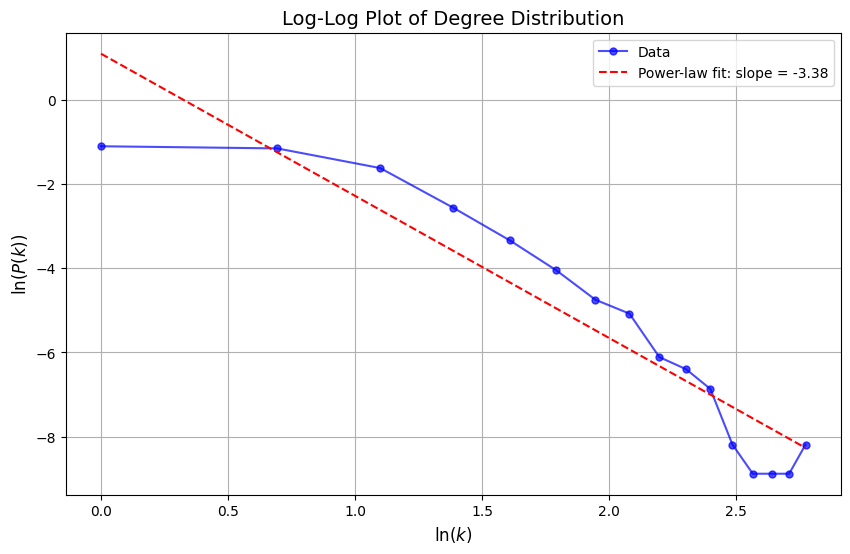

In [21]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt


# Get degrees of all nodes in the graph
degrees = [G.degree(node) for node in G.nodes()]

# Calculate the degree counts and probabilities
degree_counts = np.bincount(degrees)  # Count occurrences of each degree
k_values = np.arange(len(degree_counts))  # Degree values
P_k = degree_counts / sum(degree_counts)  # Probability of each degree

# Filter out degrees with zero probability for log-log plot
k_values_nonzero = k_values[degree_counts > 0]
P_k_nonzero = P_k[degree_counts > 0]

# Take the natural logarithm of degree values and their probabilities
ln_k = np.log(k_values_nonzero)
ln_P_k = np.log(P_k_nonzero)

# Plot ln(k) vs ln(P(k))
plt.figure(figsize=(10, 6))
plt.plot(ln_k, ln_P_k, 'bo-', markersize=5, alpha=0.7, label="Data")

# Optional: Fit a line to ln(k) vs ln(P(k)) to show power-law behavior
# Linear fit on log-log scale to approximate power-law exponent
slope, intercept = np.polyfit(ln_k, ln_P_k, 1)
plt.plot(ln_k, slope * ln_k + intercept, 'r--', label=f"Power-law fit: slope = {slope:.2f}")



# Set plot labels and title
plt.xlabel(r'$\ln(k)$', fontsize=12)
plt.ylabel(r'$\ln(P(k))$', fontsize=12)
plt.title("Log-Log Plot of Degree Distribution", fontsize=14)
plt.legend()
plt.grid(True)
plt.show()


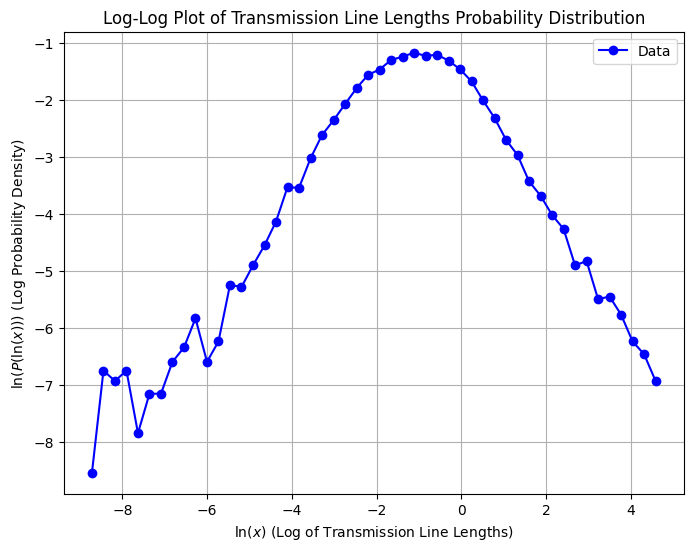

In [22]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming 'line_lengths' is an array or list of transmission line lengths
line_lengths = np.array(lines['x'])  # Ensure it's a numpy array if it's not already

# 1. Calculate the histogram (probability distribution) of the line lengths
hist, bin_edges = np.histogram(line_lengths, bins=50, density=True)  # Using 50 bins
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2  # Compute bin centers

# 2. Filter out zero probabilities for log-log transformation
nonzero_indices = hist > 0
x_nonzero = bin_centers[nonzero_indices]
P_x_nonzero = hist[nonzero_indices]

# Step 1: Compute ln(x)
ln_x = np.log(line_lengths)

# Step 2: Create a histogram of ln(x) for probability density
# Set bins to cover the range of ln(x) values
hist, bin_edges = np.histogram(ln_x, bins=50, density=True)
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2  # Get bin centers

# Step 3: Calculate ln(P(ln(x)))
ln_p_ln_x = np.log(hist + 1e-10)  # Adding a small value to avoid log(0)

# Plot ln(x) vs ln(P(ln(x)))
plt.figure(figsize=(8, 6))
plt.plot(bin_centers, ln_p_ln_x, 'o-', color='blue', label='Data')

# Set plot labels and title
plt.xlabel(r"$\ln(x)$ (Log of Transmission Line Lengths)")
plt.ylabel(r"$\ln(P(\ln(x)))$ (Log Probability Density)")
plt.title("Log-Log Plot of Transmission Line Lengths Probability Distribution")
plt.legend()
plt.grid(True)
plt.show()

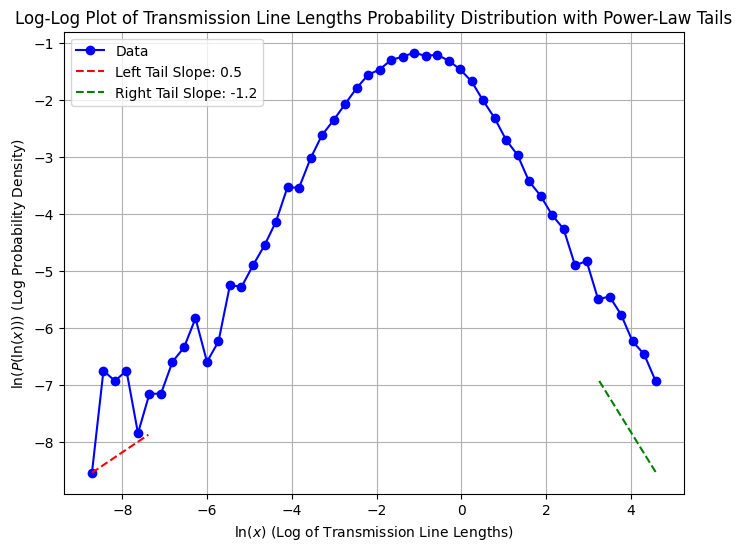

In [23]:

# Plot ln(x) vs ln(P(ln(x)))
plt.figure(figsize=(8, 6))
plt.plot(bin_centers, ln_p_ln_x, 'o-', color='blue', label='Data')

# Adjusted slopes for left and right tails to better fit data
left_tail_slope = 0.5  # Adjusted slope for the left tail
right_tail_slope = -1.2  # Adjusted slope for the right tail

# Select two points in each tail for reference lines
# Left tail (using points from lower range of bin_centers)
x_left_tail = np.array([min(bin_centers), np.percentile(bin_centers, 10)])
y_left_tail = left_tail_slope * (x_left_tail - x_left_tail[0]) + ln_p_ln_x[0]

# Right tail (using points from higher range of bin_centers)
x_right_tail = np.array([np.percentile(bin_centers, 90), max(bin_centers)])
y_right_tail = right_tail_slope * (x_right_tail - x_right_tail[0]) + ln_p_ln_x[-1]

# Plot the reference lines
plt.plot(x_left_tail, y_left_tail, 'r--', label=f'Left Tail Slope: {left_tail_slope}')
plt.plot(x_right_tail, y_right_tail, 'g--', label=f'Right Tail Slope: {right_tail_slope}')

# Set plot labels and title
plt.xlabel(r"$\ln(x)$ (Log of Transmission Line Lengths)")
plt.ylabel(r"$\ln(P(\ln(x)))$ (Log Probability Density)")
plt.title("Log-Log Plot of Transmission Line Lengths Probability Distribution with Power-Law Tails")
plt.legend()
plt.grid(True)
plt.show()


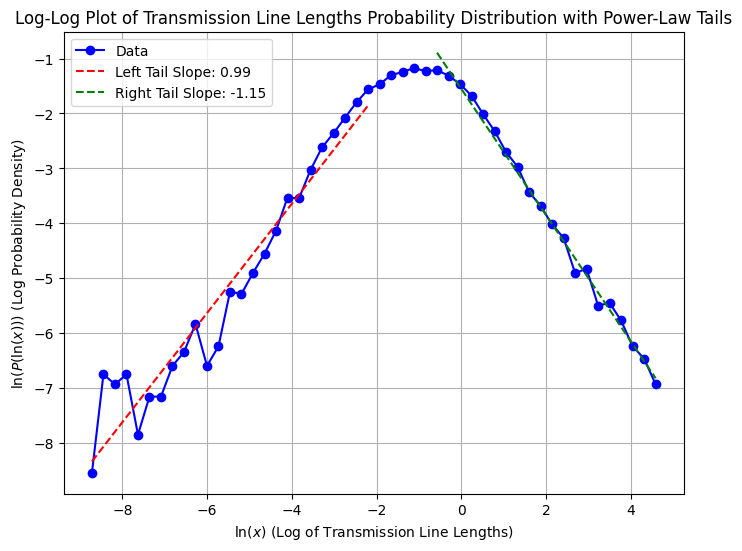

Left tail slope: 0.99
Right tail slope: -1.15


In [24]:

from scipy.stats import linregress

# Split into left and right tails (e.g., lower 10% and upper 10% of ln_x)
# Modify these percentiles if you want a narrower or wider selection of points for each tail
left_tail_indices = bin_centers < np.percentile(bin_centers, 50)
right_tail_indices = bin_centers > np.percentile(bin_centers, 60)

# Step 4: Perform linear regression on each tail
# Left tail
slope_left, intercept_left, r_value_left, p_value_left, std_err_left = linregress(
    bin_centers[left_tail_indices], ln_p_ln_x[left_tail_indices]
)

# Right tail
slope_right, intercept_right, r_value_right, p_value_right, std_err_right = linregress(
    bin_centers[right_tail_indices], ln_p_ln_x[right_tail_indices]
)

# Plot the data and the fitted lines
plt.figure(figsize=(8, 6))
plt.plot(bin_centers, ln_p_ln_x, 'o-', color='blue', label='Data')

# Plot the fitted lines for the left and right tails
plt.plot(bin_centers[left_tail_indices],
         slope_left * bin_centers[left_tail_indices] + intercept_left,
         'r--', label=f'Left Tail Slope: {slope_left:.2f}')

plt.plot(bin_centers[right_tail_indices],
         slope_right * bin_centers[right_tail_indices] + intercept_right,
         'g--', label=f'Right Tail Slope: {slope_right:.2f}')

# Set plot labels and title
plt.xlabel(r"$\ln(x)$ (Log of Transmission Line Lengths)")
plt.ylabel(r"$\ln(P(\ln(x)))$ (Log Probability Density)")
plt.title("Log-Log Plot of Transmission Line Lengths Probability Distribution with Power-Law Tails")
plt.legend()
plt.grid(True)
plt.show()

# Print out the slopes for reference
print(f"Left tail slope: {slope_left:.2f}")
print(f"Right tail slope: {slope_right:.2f}")


In [25]:
lines.head()

,Line Number,Bus 1,Bus 2,x
0,1,14430,13769,0.176627
1,2,14429,13074,0.102980
2,3,14428,14036,0.084389
3,4,14427,14007,0.011286
4,5,14426,12302,0.137005


In [26]:
bus_locations.head()

,Bus Number,Lon,Lat
0,1,-114.808295,33.285811
1,2,-109.168098,45.131739
2,3,-118.686391,36.191126
3,4,-122.776463,49.148646
4,5,-106.566784,45.765771


# Implementation of DC Power flow model

In [27]:
import pandas as pd
import numpy as np
import networkx as nx
import random

# Load data

bus_locations = pd.read_csv('https://raw.githubusercontent.com/ikaurrr/Project-A-Study-of-Cascading-Failures-in-Real-and-Synthetic-Power-Grid-Topologies/main/Gen_WI_Bus_Locations.csv')
lines = pd.read_csv('https://raw.githubusercontent.com/ikaurrr/Project-A-Study-of-Cascading-Failures-in-Real-and-Synthetic-Power-Grid-Topologies/main/Gen_WI_Lines.csv')
supply_values = pd.read_csv('https://raw.githubusercontent.com/ikaurrr/Project-A-Study-of-Cascading-Failures-in-Real-and-Synthetic-Power-Grid-Topologies/main/Gen_WI_Supply_Values.csv')
demand_values = pd.read_csv('https://raw.githubusercontent.com/ikaurrr/Project-A-Study-of-Cascading-Failures-in-Real-and-Synthetic-Power-Grid-Topologies/main/Gen_WI_Demand_Values.csv')


# Step 1: Construct the network graph
def construct_graph(bus_locations, lines):
    G = nx.Graph()

    # Add nodes with positions
    for _, row in bus_locations.iterrows():
        G.add_node(row["Bus Number"], pos=(row["Lon"], row["Lat"]), supply=0, demand=0)

    # Add edges with resistance
    for _, row in lines.iterrows():
        G.add_edge(row["Bus 1"], row["Bus 2"], resistance=row["x"])

    return G

# Step 2: Assign supply and demand to nodes
def assign_supply_demand(G, supply_values, demand_values):
    for _, row in supply_values.iterrows():
        if row["Bus Number"] in G.nodes:
            G.nodes[row["Bus Number"]]["supply"] = row["Supply (MW)"]

    for _, row in demand_values.iterrows():
        if row["Bus Number"] in G.nodes:
            G.nodes[row["Bus Number"]]["demand"] = row["Demand (MW)"]

# Step 3: Solve DC power flow model
def solve_dc_power_flow(G):
    currents = {}
    for edge in G.edges(data=True):
        i, j, data = edge
        resistance = data["resistance"]
        voltage_diff = G.nodes[i].get("voltage", 0) - G.nodes[j].get("voltage", 0)
        currents[(i, j)] = voltage_diff / resistance
        currents[(j, i)] = -currents[(i, j)]
    return currents

# Step 4: Set capacities and simulate cascading failures
def cascading_failures(G, currents, p=0.9, α=1.5, u=1.0, Δu=0.1):
    line_currents = list(currents.values())
    line_currents.sort()
    Ip = line_currents[int(p * len(line_currents))]  # Standard capacity

    capacities = {}
    for edge, current in currents.items():
        capacities[edge] = max(Ip, α * abs(current))

    # Initial failure
    u_index = int((1 - u) * len(line_currents))
    Δu_index = int((1 - u + Δu) * len(line_currents))
    initial_failures = [edge for edge, current in currents.items() if abs(current) in line_currents[u_index:Δu_index]]

    for edge in initial_failures:
        G.remove_edge(*edge)

    # Cascade simulation
    time_step = 0
    while True:
        time_step += 1
        # Recalculate currents
        currents = solve_dc_power_flow(G)
        overloaded_edges = [
            edge for edge, current in currents.items() if abs(current) > capacities.get(edge, float('inf'))
        ]

        if not overloaded_edges:
            break

        # Remove overloaded edges
        G.remove_edges_from(overloaded_edges)

    return G, time_step

# Main simulation
def main():
    # Construct the network graph
    G = construct_graph(bus_locations, lines)

    # Assign supply and demand
    assign_supply_demand(G, supply_values, demand_values)

    # Initialize node voltages
    for node in G.nodes:
        G.nodes[node]["voltage"] = random.uniform(-1, 1)

    # Solve DC power flow
    currents = solve_dc_power_flow(G)

    # Simulate cascading failures
    G_after_cascade, time_steps = cascading_failures(G, currents)

    print(f"Cascade completed in {time_steps} time steps.")
    return G_after_cascade

# Run the simulation
result_graph = main()


Cascade completed in 1 time steps.
